# Setup

In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib.request
import matplotlib as mpl
import matplotlib.font_manager as font_manager
urllib.request.urlretrieve('https://github.com/google/fonts/raw/main/ofl/ibmplexmono/IBMPlexMono-Regular.ttf', 'IBMPlexMono-Regular.ttf')
fe = font_manager.FontEntry(
    fname='IBMPlexMono-Regular.ttf',
    name='plexmono')
font_manager.fontManager.ttflist.append(fe)
plt.rcParams.update({'axes.facecolor':'#f5f4e9',
            'grid.color' : '#AAAAAA',
            'axes.edgecolor':'#333333',
            'figure.facecolor':'#FFFFFF',
            'axes.grid': False,
            'axes.prop_cycle':   plt.cycler('color', plt.cm.Dark2.colors),
            'font.family': fe.name,
            'figure.figsize': (3.5,3.5 / 1.2),
            'ytick.left': True,
            'xtick.bottom': True
           })

In [134]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

def mse(y, pred):
  # return np.mean((y-pred)**2)
  return mean_squared_error(y, pred)

def mae(y, pred):
  return mean_absolute_error(y, pred)

def r2(y, pred):
  return r2_score(y, pred)

def corr(y, pred):
  return np.corrcoef(y, pred)[0,1]

def acc(y, pred, threshold):
  acc = sum((abs(pred - y)<threshold))/len(pred)
  return acc


# Loading results

In [135]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [136]:
df = pd.read_csv("ablation_results.csv", sep=';', encoding="ISO-8859-1")
df.columns
# df.iloc[47600]

Index(['y', 'yhat', 'yprobs', 'data', 'model', 'Temperature', 'k_selected',
       'N_train', 'model_class', 'n_tokens', 'x'],
      dtype='object')

In [138]:
df[df['model_class']=='multi'].groupby(['Temperature', 'data', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,C2,5,multi,1,text-curie-001,977
1,0.05,C2,5,multi,1,text-davinci-001,904
2,0.05,C2,5,multi,2,text-davinci-001,815
3,0.05,C2,5,multi,3,text-davinci-001,712
4,0.05,C2,5,multi,4,text-davinci-001,776
5,0.05,C2,5,multi,5,text-curie-001,737
6,0.05,C2,5,multi,5,text-davinci-001,857
7,0.05,C2,5,multi,10,text-curie-001,823
8,0.05,C2,5,multi,10,text-davinci-001,789
9,0.05,C2,5,multi,25,text-curie-001,833


# Plotting

## templates

In [115]:
def select_df(df, data, k, T, model, model_class, N):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  q = f"data=='{data}' and "
  q+= f"Temperature=={T} and "
  if k != 'any':  
    q+= f"k_selected=={k} and "
  if model != 'any': 
    q+= f"model=='{model}' and "
  q+= f"model_class=='{model_class}' and "
  q+= f"N_train=={N}"

  sel = df.query(q)
  if sel.empty:
    raise ValueError(f"Dataframe is empty for the configuration {config}")
  return sel

In [116]:
def plot_parities(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, axis_name=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  if sum([1 for i in config.values() if i is None]) > 1:
    raise ValueError("Only the property being varied in data_range can me passed as None.")

  if nrows*ncols < len(data_range):
    raise ValueError('''There's not enough space to plat all data in data_range.
    Decrease the size of data_range or increase ncols or nrows.''')

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprob=[]
    ax = axs if ncols*nrows == 1 else axs.flatten()[i]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
      yprob.append(df_sel[df_sel['y']==d]['yprobs'].values)

    ax.plot(y,y)
    ax.scatter(
        y, [yhi.mean() for yhi in yhat], s=6, alpha=0.8, color=f"C{i}"
    )
    ax.errorbar(y, 
                [yhi.mean() for yhi in yhat], 
                yerr=[yhi.std() if len(yhi)>1 else ypi[0] for yhi,ypi in zip(yhat, yprob)],
                fmt='.', color='gray', alpha=0.4)
    ax.set_title(f"{data_property}={p}")

    lim = (min(y), max(y))

    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"correlation = {corr(y, [yhi.mean() for yhi in yhat]):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"RMSE = {np.sqrt(mse(y, [yhi.mean() for yhi in yhat])):.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"MAE = {mae(y, [yhi.mean() for yhi in yhat]):.3f}")

    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.set_xlabel("label")
    if (i%ncols==0):
      ax.set_ylabel(f"predicted {axis_name}")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)


In [117]:
def plot_ablation(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_list = []
  r_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)

    r_list.append(corr(y, [yhi.mean() for yhi in yhat]))
    MAE_list.append(mae(y, [yhi.mean() for yhi in yhat]))
    prop_list.append(p)

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  
  axs[0].plot(prop_list, MAE_list)
  axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("MAE")
  
  axs[1].plot(prop_list, r_list)
  axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("correlation")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)

In [118]:
def plot_ablation(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_mean_list = []
  MAE_max_list  = []
  MAE_min_list  = []
  r_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    MAE_mean = []
    MAE_max  = []
    MAE_min  = []
    config[data_property] = p
    y=[]
    yhat=[]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)

    r_list.append(corr(y, [yhi.mean() for yhi in yhat]))
    for yi, yhi in zip(y, yhat):
      maes = np.array([np.abs(yi-yhii) for yhii in yhi])
      MAE_mean.append(maes.mean())
      MAE_max.append(maes.max())
      MAE_min.append(maes.min())
    MAE_mean_list.append(np.array(MAE_mean).mean())
    MAE_max_list.append(np.array(MAE_max).mean())
    MAE_min_list.append(np.array(MAE_min).mean())
    prop_list.append(p)

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  
  axs[0].plot(prop_list, MAE_mean_list)
  axs[0].fill_between(prop_list, MAE_min_list, MAE_max_list, alpha=0.2)
  axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("MAE")

  axs[1].plot(prop_list, r_list)
  axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("correlation")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)

## C2

In [119]:
c2_data = df[(df['data'] == 'C2')]
c2_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
6,0.05,5,GPR,1,text-ada-001,254
7,0.05,5,GPR,5,text-ada-001,254
8,0.05,5,GPR,10,text-ada-001,254
9,0.05,5,GPR,25,text-ada-001,254
10,0.05,5,GPR,50,text-ada-001,254
11,0.05,5,GPR,100,text-ada-001,254
12,0.05,5,GPR,200,text-ada-001,254
0,0.05,0,finetune,10,ada:ft-white-research-laboratory-2023-03-07-22...,547
1,0.05,0,finetune,50,ada:ft-white-research-laboratory-2023-03-07-23...,387
2,0.05,0,finetune,100,ada:ft-white-research-laboratory-2023-03-08-01...,502


### multi

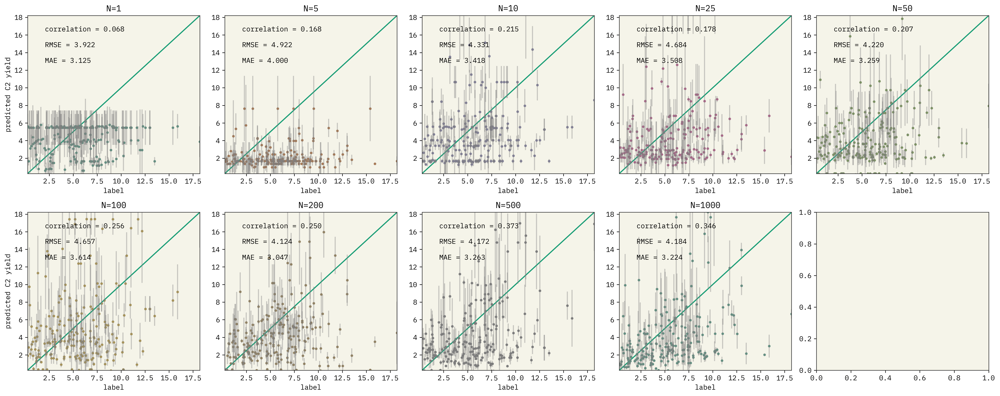

In [21]:
plot_parities(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_curie.png")

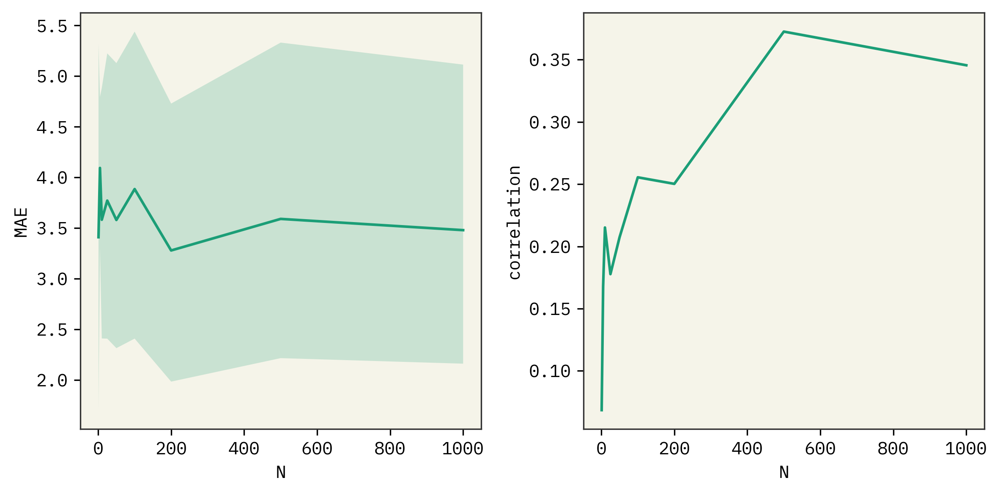

In [22]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_C2_multi_N_curie.png")


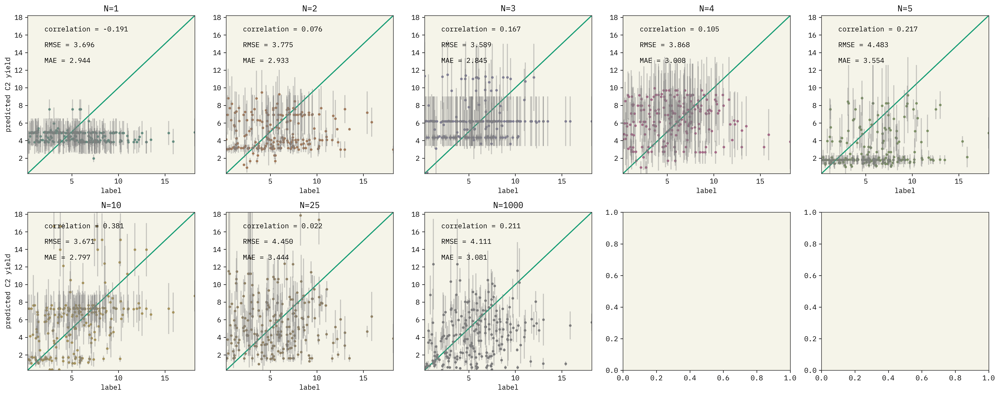

In [23]:
plot_parities(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-davinci-001',
              model_class='multi', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_davinci.png")

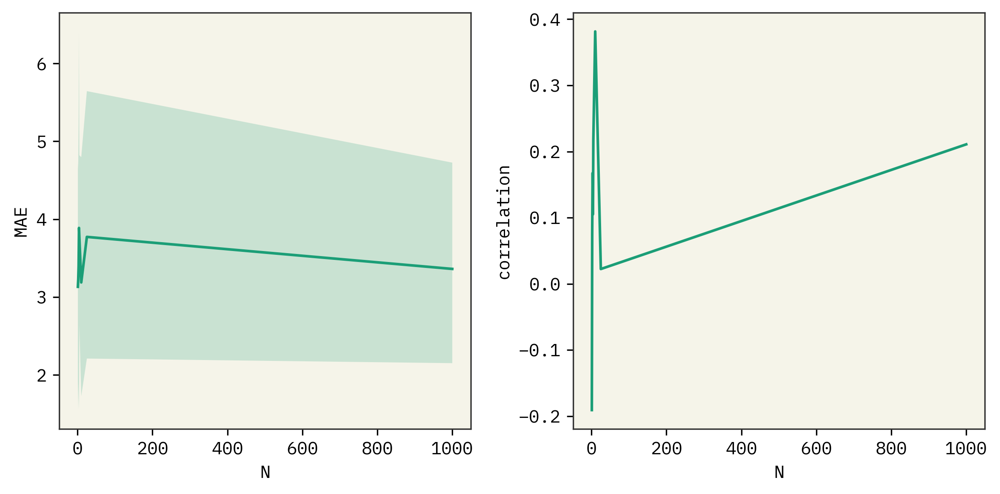

In [24]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='C2',
              k=5,
              T=0.05,
              model='text-davinci-001',
              model_class='multi',
              N=None,
              out_name="ablation_C2_multi_N_davinci.png")

### topk

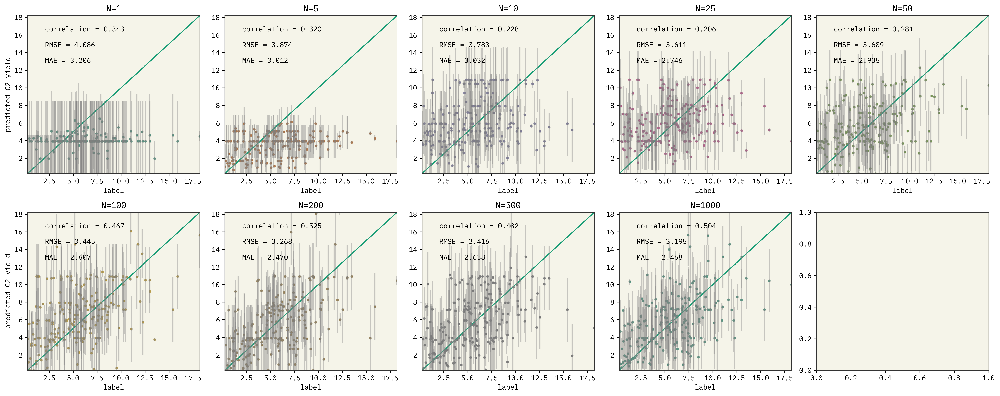

In [25]:
plot_parities(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_curie.png")

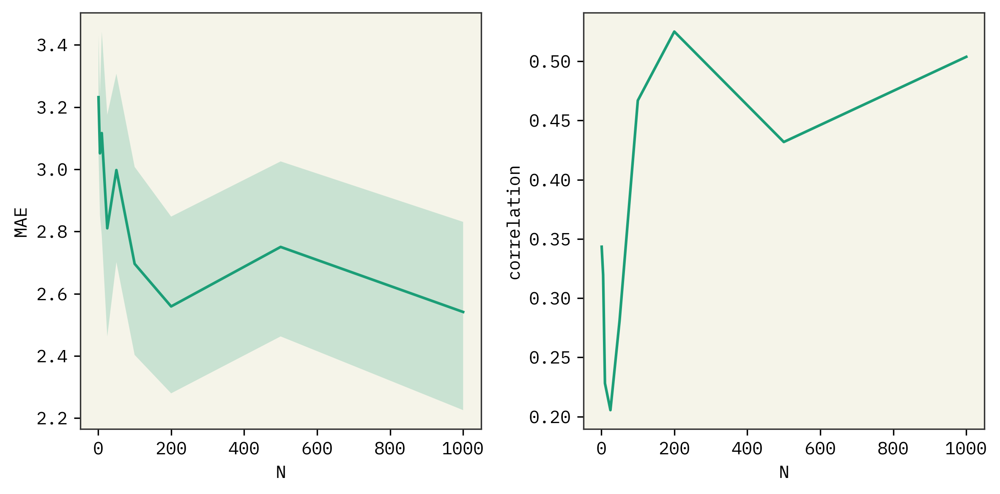

In [26]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_curie.png")

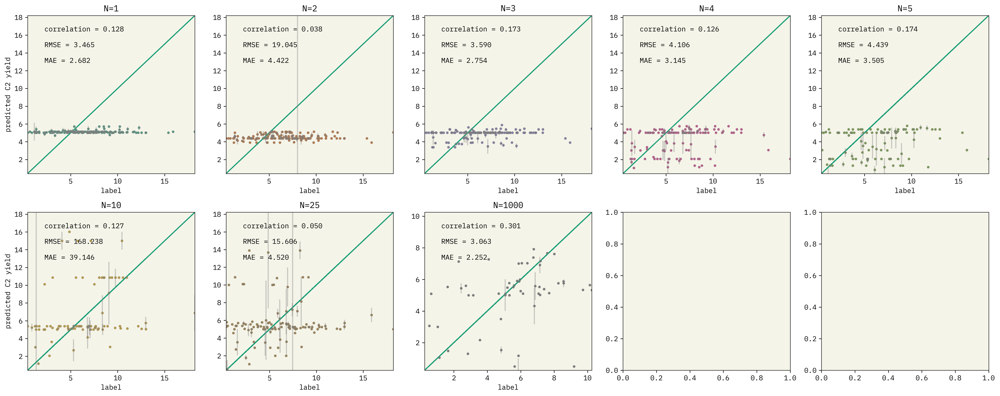

In [27]:
plot_parities(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-davinci-001',
              model_class='topk', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_davinci.png")

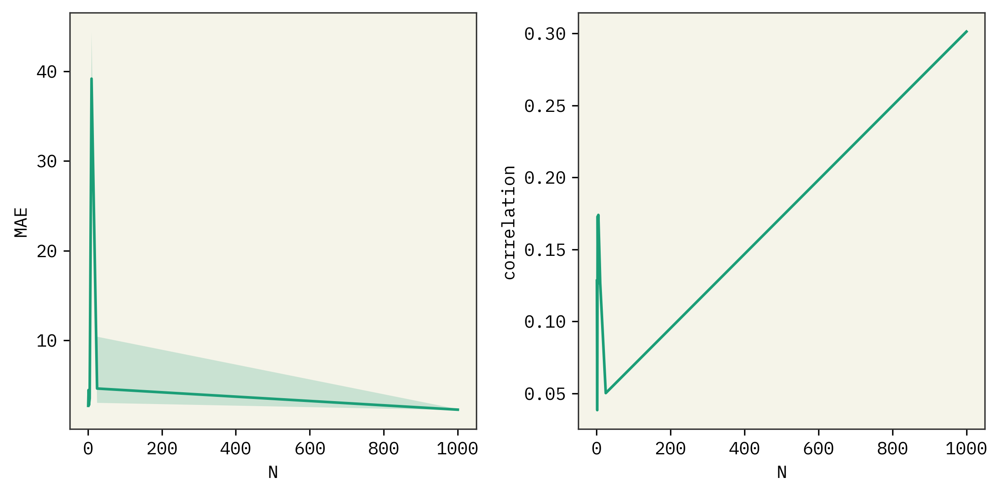

In [28]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-001")]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='C2',
              k=5,
              T=0.05,
              model='text-davinci-001',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_davinci.png")

### GPR

### finetune

In [122]:
def plot_parities(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, axis_name=None, out_name=None):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  if sum([1 for i in config.values() if i is None]) > 1:
    raise ValueError("Only the property being varied in data_range can me passed as None.")

  if nrows*ncols < len(data_range):
    raise ValueError('''There's not enough space to plat all data in data_range.
    Decrease the size of data_range or increase ncols or nrows.''')

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprob=[]
    ax = axs if ncols*nrows == 1 else axs.flatten()[i]

    df_sel = select_df(df, **config)

    for d in df_sel['y'].unique():
      y.append(d)
      # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
      yhat.append(df_sel[df_sel['y']==d]['yhat'].values)
      yprob.append(df_sel[df_sel['y']==d]['yprobs'].values)

    yprob = [yhi.std() for yhi in yhat]

    ax.plot(y,y)
    ax.scatter(
        y, [yhi.mean() for yhi in yhat], s=6, alpha=0.8, color=f"C{i}"
    )
    ax.errorbar(y, 
                [yhi.mean() for yhi in yhat], 
                # yerr=[yhi.std() if len(yhi)>1 else sum(yprob)/len(yprob) for yhi,ypi in zip(yhat, yprob)],
                yerr=[yhi.std() if len(yhi)>1 else max(yprob) for yhi,ypi in zip(yhat, yprob)],
                fmt='.', color='gray', alpha=0.4)
    ax.set_title(f"{data_property}={p}")

    lim = (min(y), max(y))

    ax.text(lim[0] + 0.01*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"correlation = {corr(y, [yhi.mean() for yhi in yhat]):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"RMSE = {np.sqrt(mse(y, [yhi.mean() for yhi in yhat])):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"MAE = {mae(y, [yhi.mean() for yhi in yhat]):.3f}")

    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.set_xlabel("measured C2 yield")
    if (i%ncols==0):
      ax.set_ylabel(f"predicted {axis_name}")

  plt.tight_layout()
  # plt.show()
  # if (out_name):
  #   plt.savefig(f"figs/{out_name}", dpi=300)


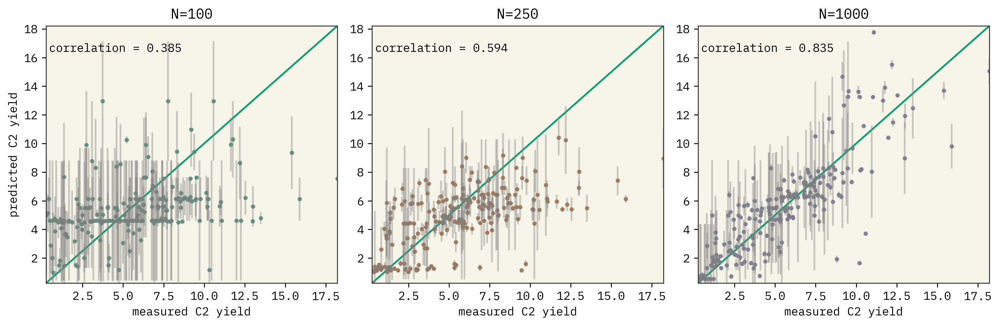

In [123]:
plot_parities(c2_data, 
              'N', 
              [100,250,1000], #sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_FT_N_ada.png")

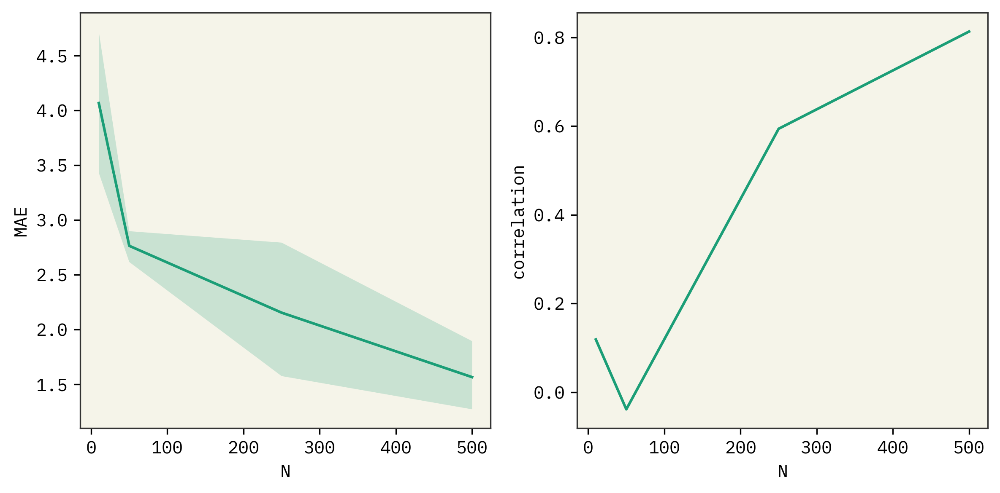

In [88]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='C2',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_C2_FT_N_ada.png")

### curie X davinci

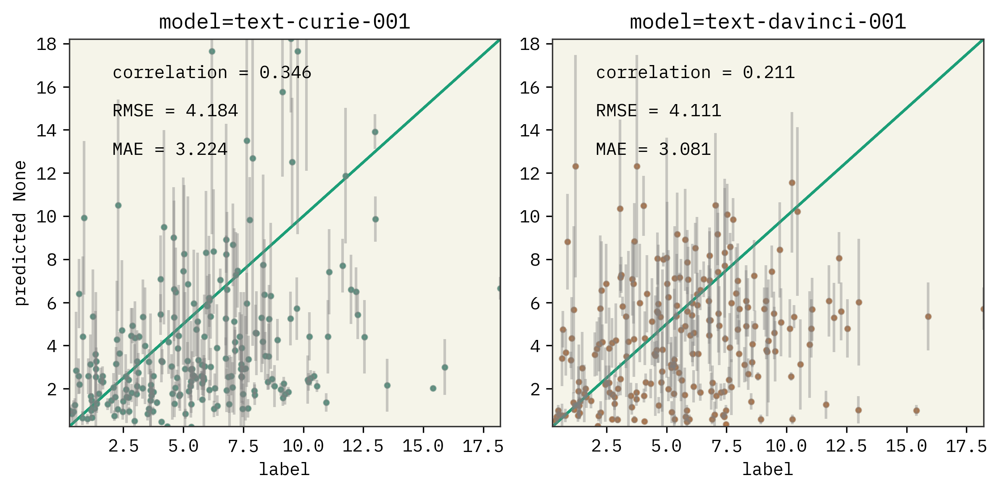

In [31]:
plot_parities(df, 
              'model', 
              sorted(c2_data[c2_data['model_class']=="multi"]['model'].unique()), 
              nrows=1, ncols=2,
              data='C2', 
              k=5, 
              T=0.05, 
              model=None,
              model_class='multi', 
              N=1000,
              out_name="par_C2_multi_N_curieXdavinci.png")

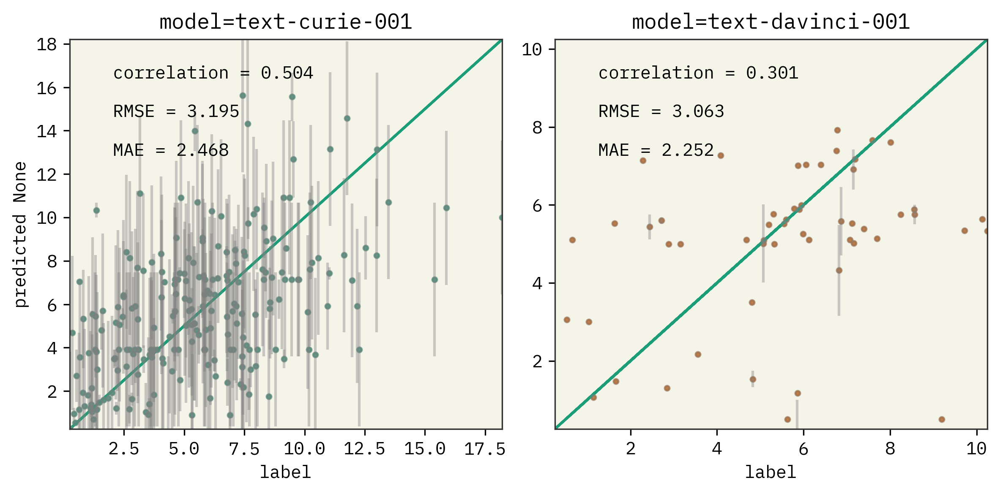

In [32]:
plot_parities(df, 
              'model', 
              sorted(c2_data[c2_data['model_class']=="topk"]['model'].unique()), 
              nrows=1, ncols=2,
              data='C2', 
              k=5, 
              T=0.05, 
              model=None,
              model_class='topk', 
              N=1000,
              out_name="par_C2_topk_N_curieXdavinci.png")

### finetune X multi X topk

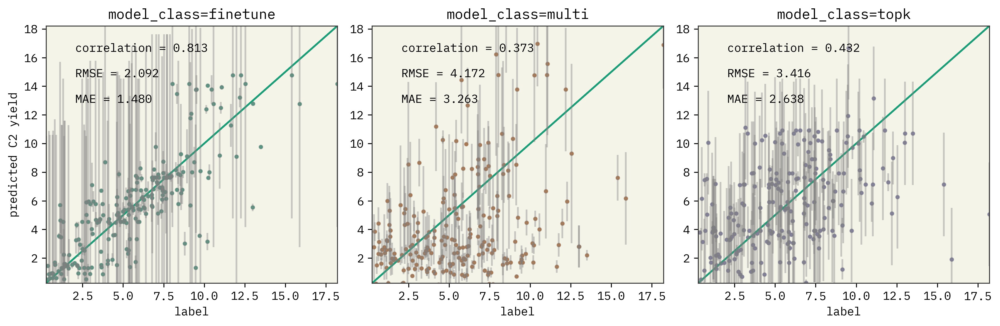

In [33]:
plot_parities(c2_data, 
              'model_class', 
              sorted(c2_data['model_class'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k='any',
              T=0.05,
              model='any',
              model_class=1,
              N=500,
              axis_name="C2 yield",
              out_name="par_sol_FT_N_allClasses.png")

## iupac sol

In [34]:
iupac_sol_data = df[(df['data'] == 'iupac-sol')]
iupac_sol_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
0,0.05,0,finetune,50,ada:ft-white-research-laboratory-2023-02-28-19...,476
1,0.05,0,finetune,100,ada:ft-white-research-laboratory-2023-02-28-19...,885
2,0.05,0,finetune,250,ada:ft-white-research-laboratory-2023-02-28-19...,885
3,0.05,0,finetune,500,ada:ft-white-research-laboratory-2023-02-28-20...,885
4,0.05,0,finetune,700,ada:ft-white-research-laboratory-2023-02-28-21...,885
5,0.05,5,multi,1,text-curie-001,362
6,0.05,5,multi,5,text-curie-001,532
7,0.05,5,multi,10,text-curie-001,529
8,0.05,5,multi,25,text-curie-001,590
9,0.05,5,multi,50,text-curie-001,579


### multi

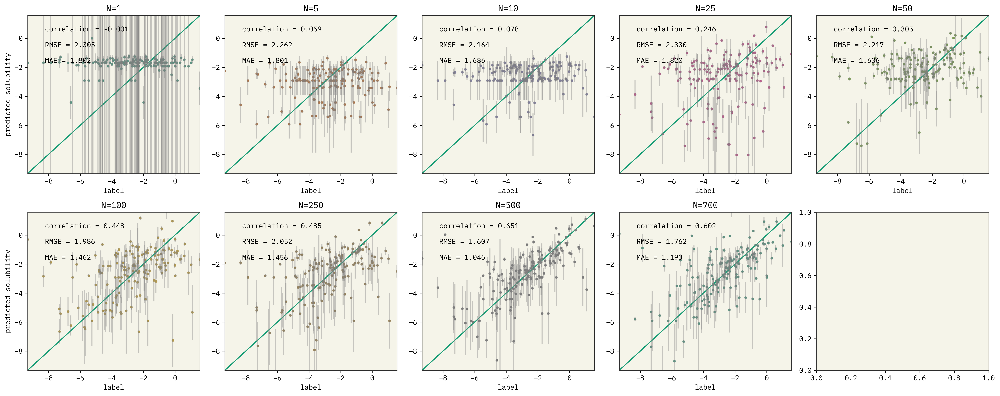

In [35]:
plot_parities(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='any', 
              model_class='multi', 
              N=None,
              axis_name="solubility",
              out_name="par_sol_multi_N_curie.png")

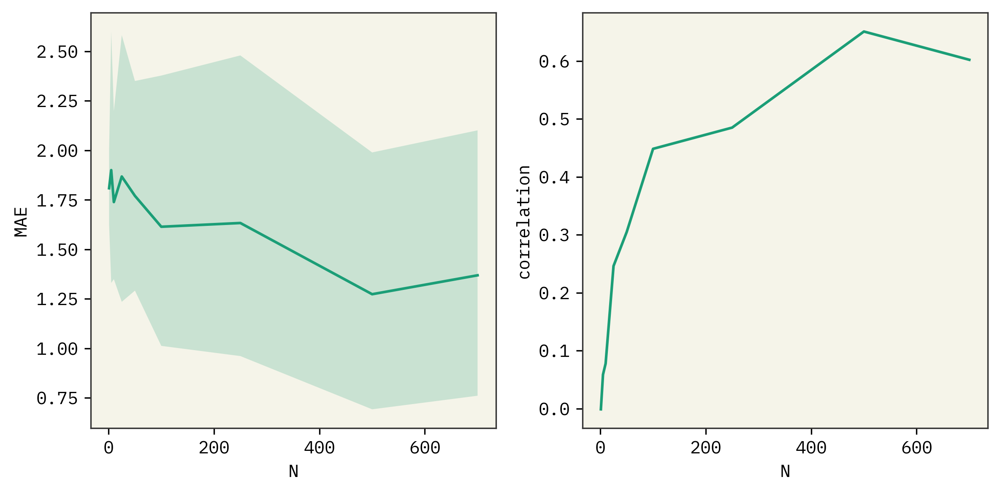

In [36]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_sol_multi_N_curie.png")

### topk

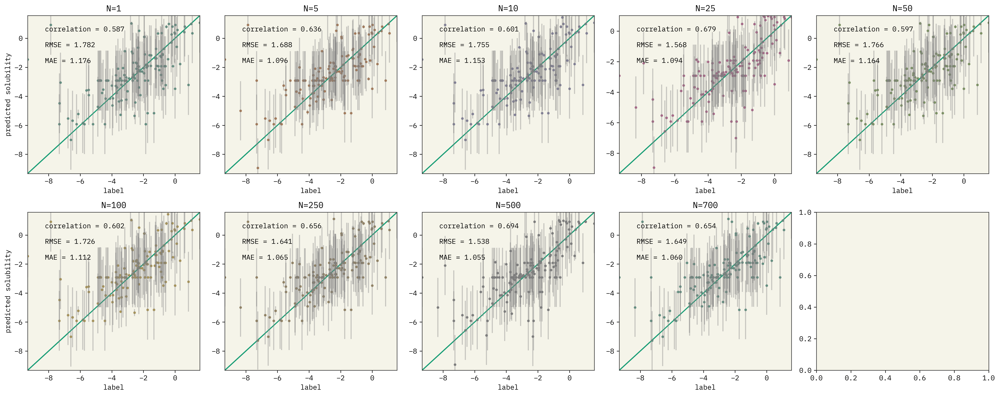

In [37]:
plot_parities(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=2, ncols=5,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='any', 
              model_class='topk',
              N=None,
              axis_name="solubility",
              out_name="par_sol_topk_N_curie.png")

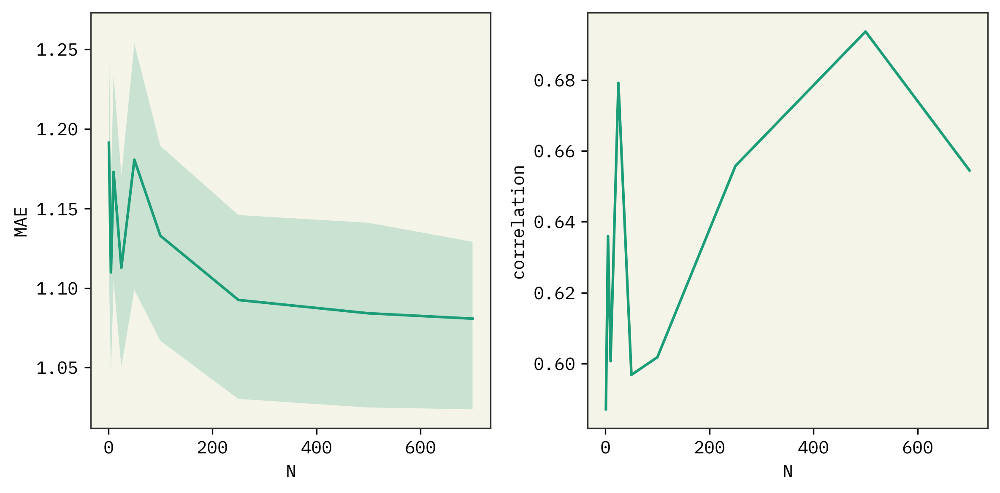

In [38]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_sol_topk_N_curie.png")

### finetune

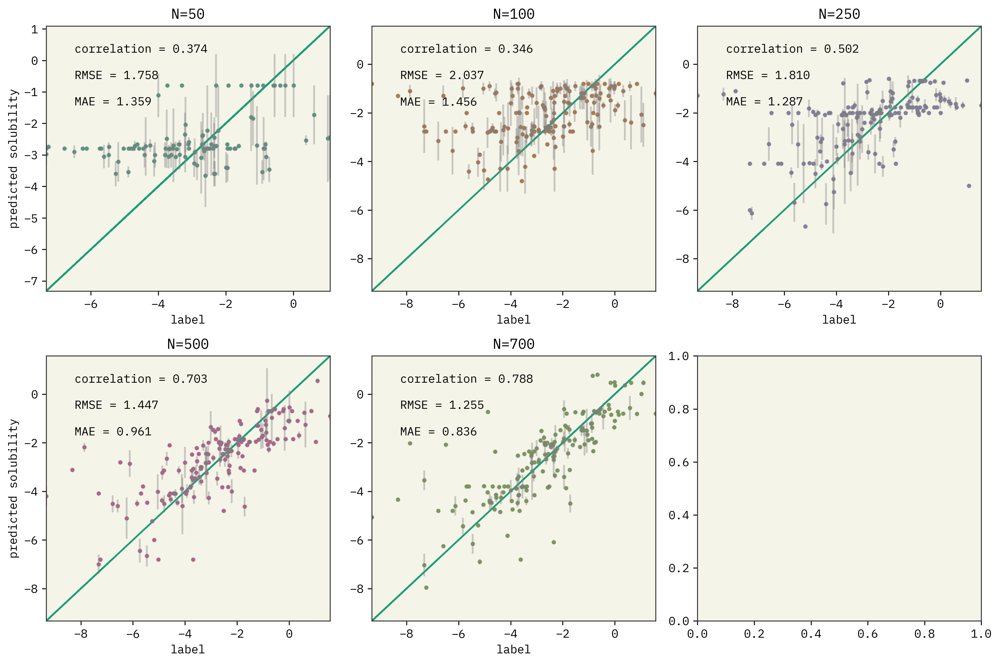

In [39]:
plot_parities(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=2, ncols=3,
              data='iupac-sol', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="solubility",
              out_name="par_sol_FT_N_ada.png")

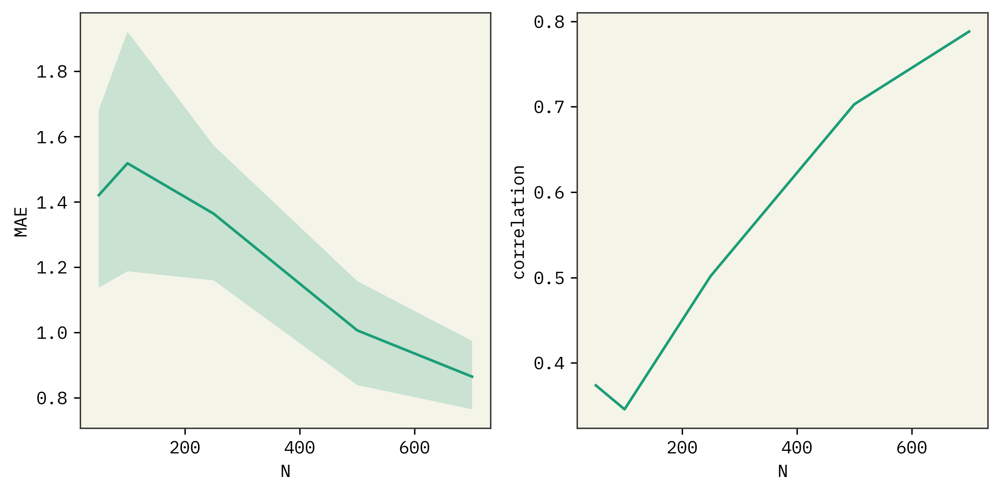

In [40]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=1, ncols=2,
              data='iupac-sol',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_sol_FT_N_ada.png")

### finetune X multi X topk

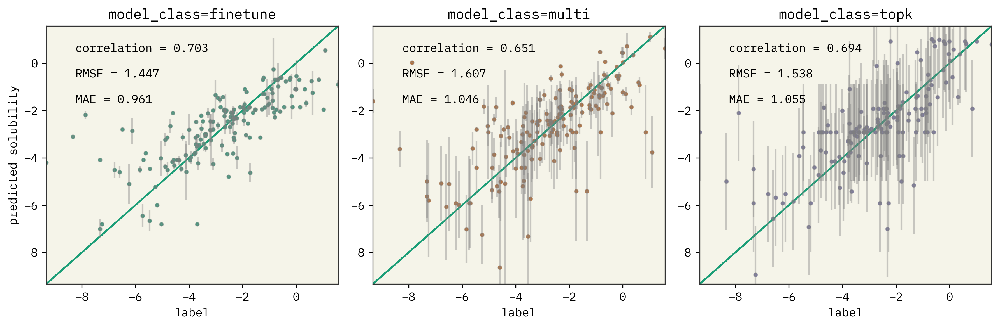

In [41]:
plot_parities(iupac_sol_data, 
              'model_class', 
              sorted(iupac_sol_data['model_class'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol', 
              k='any',
              T=0.05,
              model='any',
              model_class=None,
              N=500,
              axis_name="solubility",
              out_name="par_sol_FT_N_allClasses.png")

## alloy

In [42]:
alloy_data = df[(df['data'] == 'alloy')]
alloy_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
